In [1]:
import pandas as pd
from pathlib import Path
import numpy as np
from scipy.stats import ranksums
import matplotlib.pyplot as plt
import chart_studio
import chart_studio.tools as tls
import chart_studio.plotly as py
import plotly.express as px
%matplotlib inline
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
import dash_bio as dashbio
import os
import seaborn as sns

In [2]:
resultsDir = Path('../../../data/07_06_results/')
libraries = ['library_11_1',
 'library_15_1',
 'library_13_2',
 'library_10_1',
 'library_9_1',
 'library_11_2',
 'library_12_1',
 'library_12_2',
 'library_13_1',
 'library_14_2',
 'library_10_2']
libraries.sort()

# Table of Contents <a id='start'></a>

1. [Exploratory Analysis](#exp-data)
3. [Method 2](#Method-2)
4. [Final Results](#Final)

## Exploratory Analysis by library <a id='exp-data'></a>

### Correlations

[Correlations are based on normalized barcode abundance.](#example-cor) 

1. [library_10_1](#cor-10-1)
2. [library_10_2](#cor-10-2)
2. [library_11_1](#cor-11-1)
2. [library_11_2](#cor-11-2)
2. [library_12_1](#cor-12-1)
2. [library_12_2](#cor-12-2)
2. [library_13_1](#cor-13-1)
2. [library_13_2](#cor-13-2)
2. [library_14_2](#cor-14-2)
2. [library_15_1](#cor-15-1)
2. [library_9_1](#cor-9-1)


### PCA

1. [library_10_1](#pca-10-1)
2. [library_10_2](#pca-10-2)
2. [library_11_1](#pca-11-1)
2. [library_11_2](#pca-11-2)
2. [library_12_1](#pca-12-1)
2. [library_12_2](#pca-12-2)
2. [library_13_1](#pca-13-1)
2. [library_13_2](#pca-13-2)
2. [library_14_2](#pca-14-2)
2. [library_15_1](#pca-15-1)
2. [library_9_1](#pca-9-1)


## Method 2:

[Summary](#m2-sum)

1. [Results day 1](#m2-day1-lfc0)
2. [Results day 1, log2lfc >1](#m2-day1-lfc1)
3. [Results day 2](#m2-day2-lfc1)
4. [Results day 3](#m2-day3-lfc1)
5. [Results day 4](#m2-day4-lfc1)


## Final Results (modified Method 1):

[Summary](#m1-sum)

1. [Results day 1](#m1-day1-lfc0)
2. [Results day 1, log2lfc >1](#m1-day1-lfc1)
3. [Results day 2](#m1-day2-lfc1)
4. [Results day 3](#m1-day3-lfc1)
5. [Results day 4](#m1-day4-lfc1)


In [3]:
import pickle
a_file = open(resultsDir/"27-07-vsts.pkl", "rb")
vsts = pickle.load(a_file)
a_file.close()

### Example Correlation: <a id='example-cor'></a>

Barcode abundance vs. Fitness

[Back to the start](#start)


In [4]:
s1 = 'am728_d1_dnaid2028_TV5585A'
s2 = 'am729_d1_dnaid2028_TV5585A'

In [5]:
library='library_10_2'
df = vsts[library].set_index("Unnamed: 0")
px.scatter(df, x=df[s1], y=df[s2], template='simple_white', labels={'x': s1, 'y':s2}, trendline='ols',
          title='Correlation between 2 samples based on normalized barcode abundance',hover_data=[df.index])


In [6]:
fits = pd.read_csv(resultsDir/'20-07-m2_fits_skew')
fit_df = fits[(fits.library == library)&(fits.sampleID == s1)|(fits.sampleID == s2)]
fit_df = fit_df.pivot(index='ShortName', columns='sampleID', values='fitness')
px.scatter(fit_df, x=np.log2(fit_df[s1]), y=np.log2(fit_df[s2]), template='simple_white', labels={'x': s1, 'y':s2},  
          trendline='ols', title='Correlation between 2 samples based on gene fitness', hover_data=[fit_df.index], width=600, height=400)



## Correlation library_10_2 <a id='cor-10-2'></a>
[Back to the start](#start)

In [7]:
figuresDir = Path('../../../data/27_07_figures/')

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



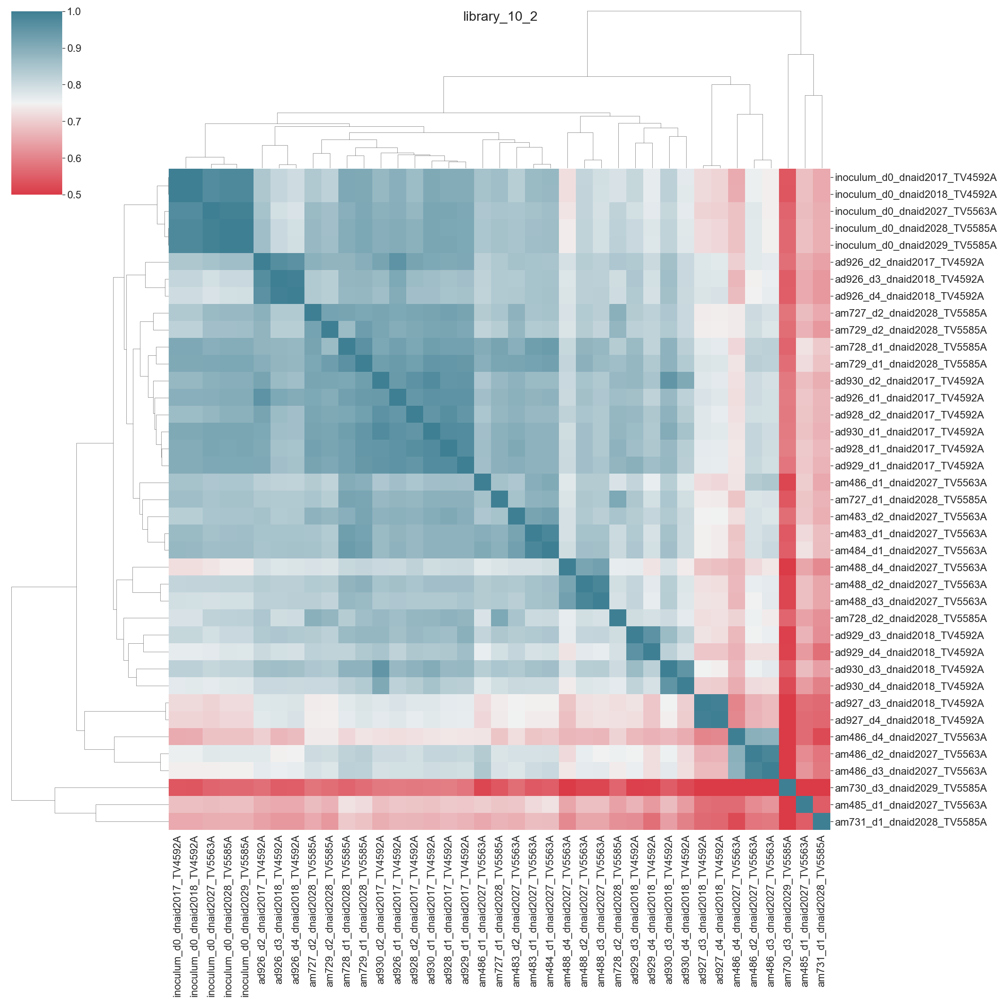

In [8]:
library = 'library_10_2'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_11_1 <a id='cor-11-1'></a>

[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



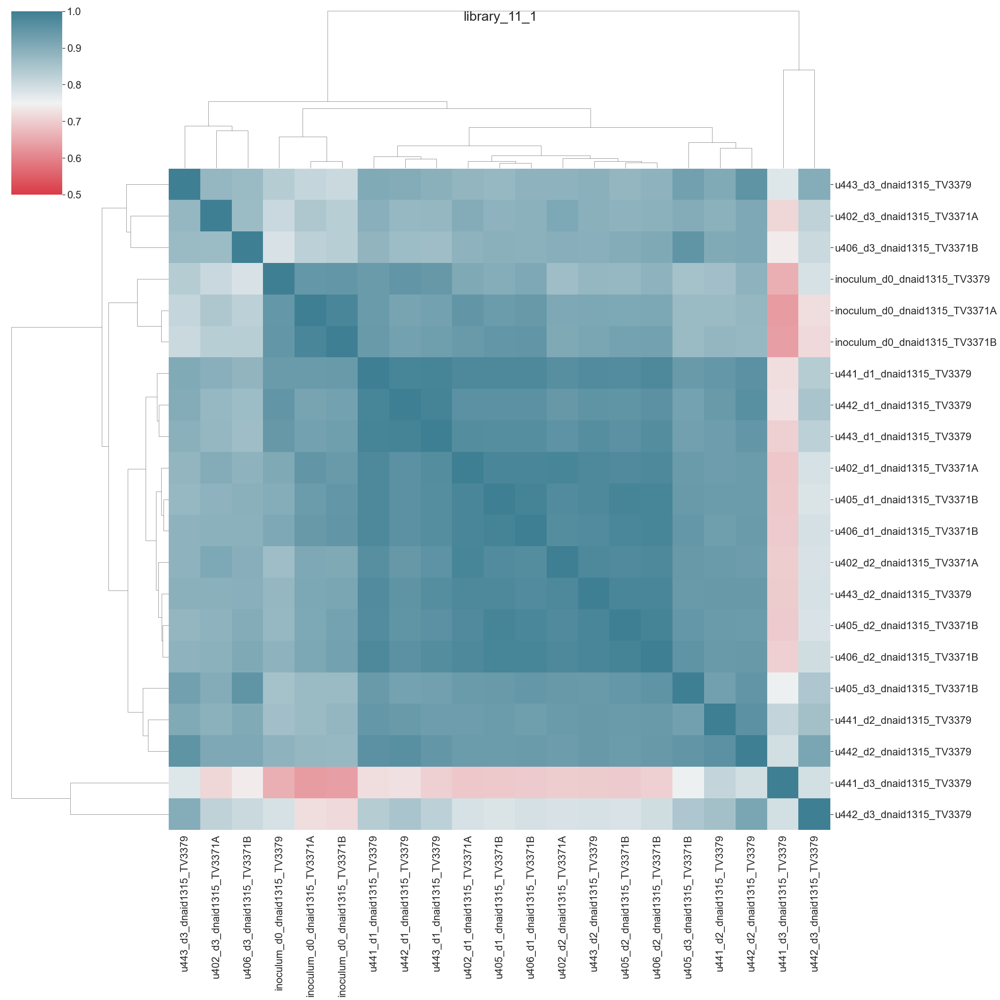

In [9]:
library = 'library_11_1'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_11_2 <a id='cor-11-2'></a>

[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



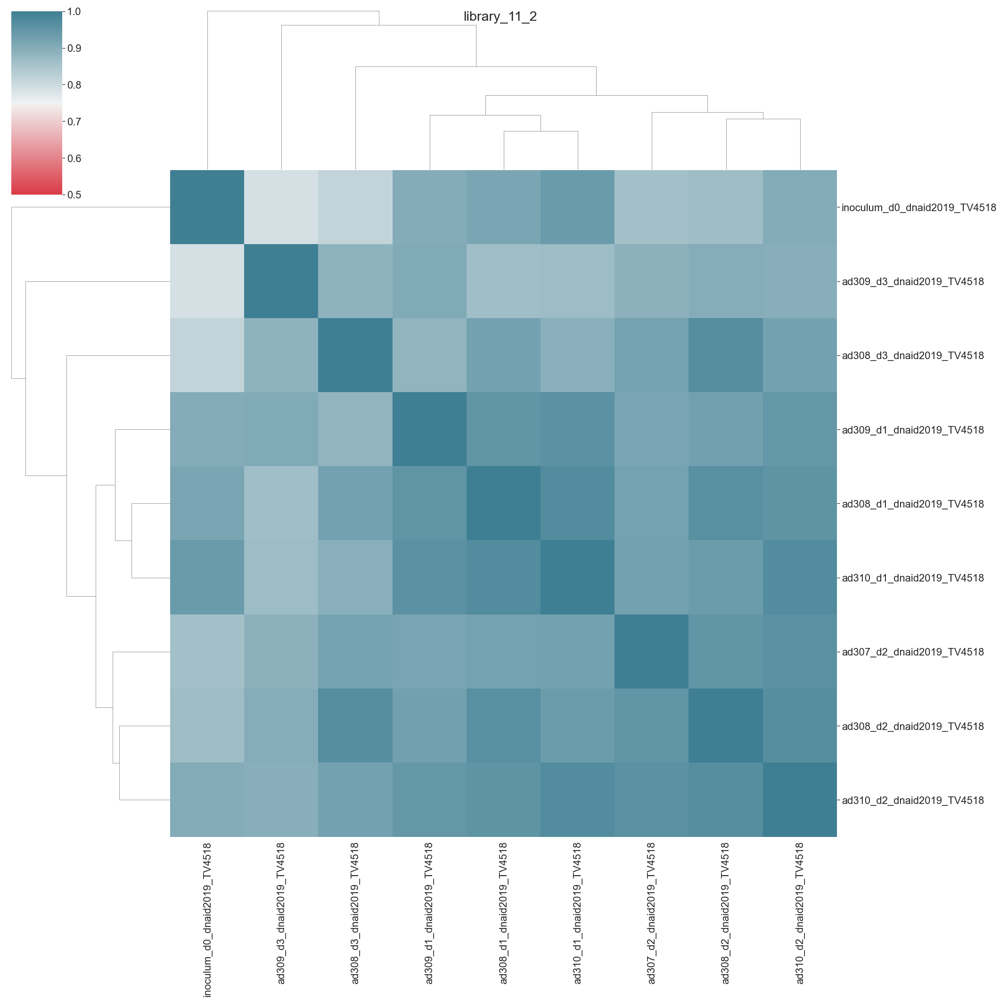

In [10]:
library = 'library_11_2'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_12_1 <a id='cor-12-1'></a>
[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



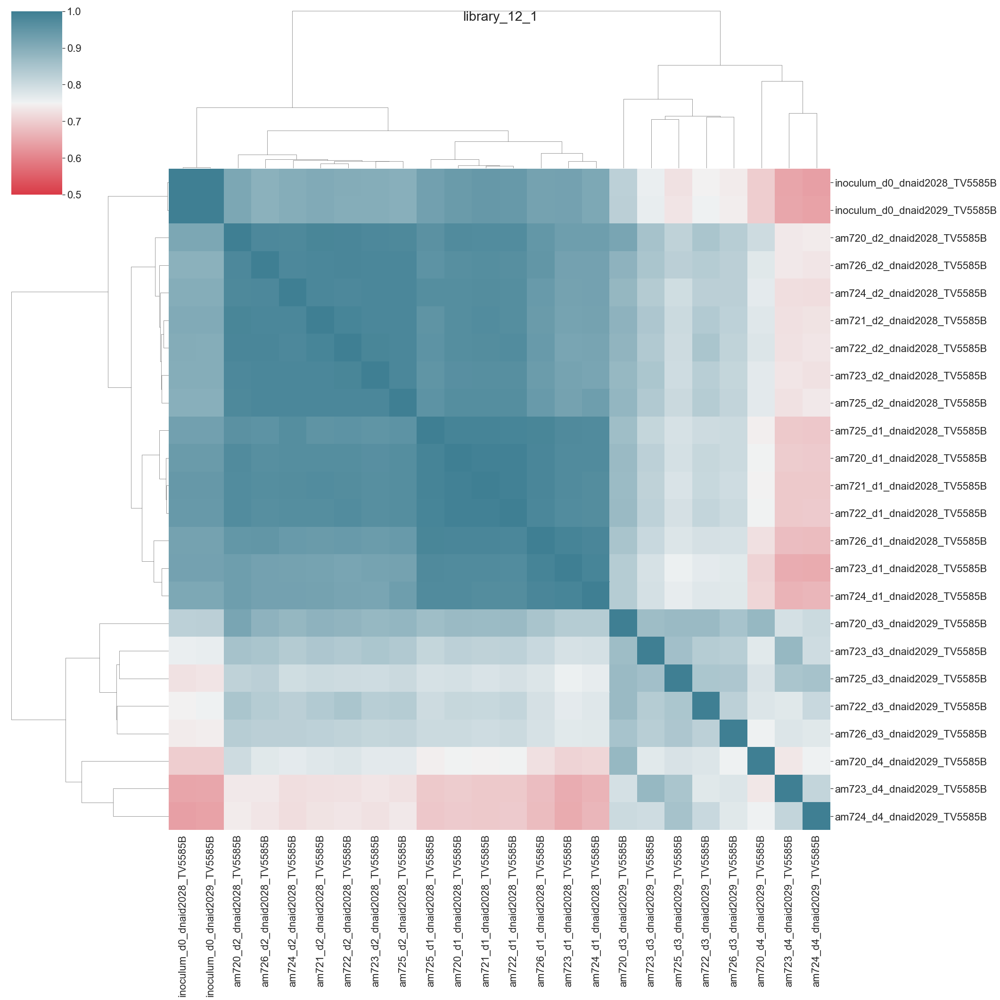

In [11]:
library = 'library_12_1'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_12_2 <a id='cor-12-2'></a>
[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



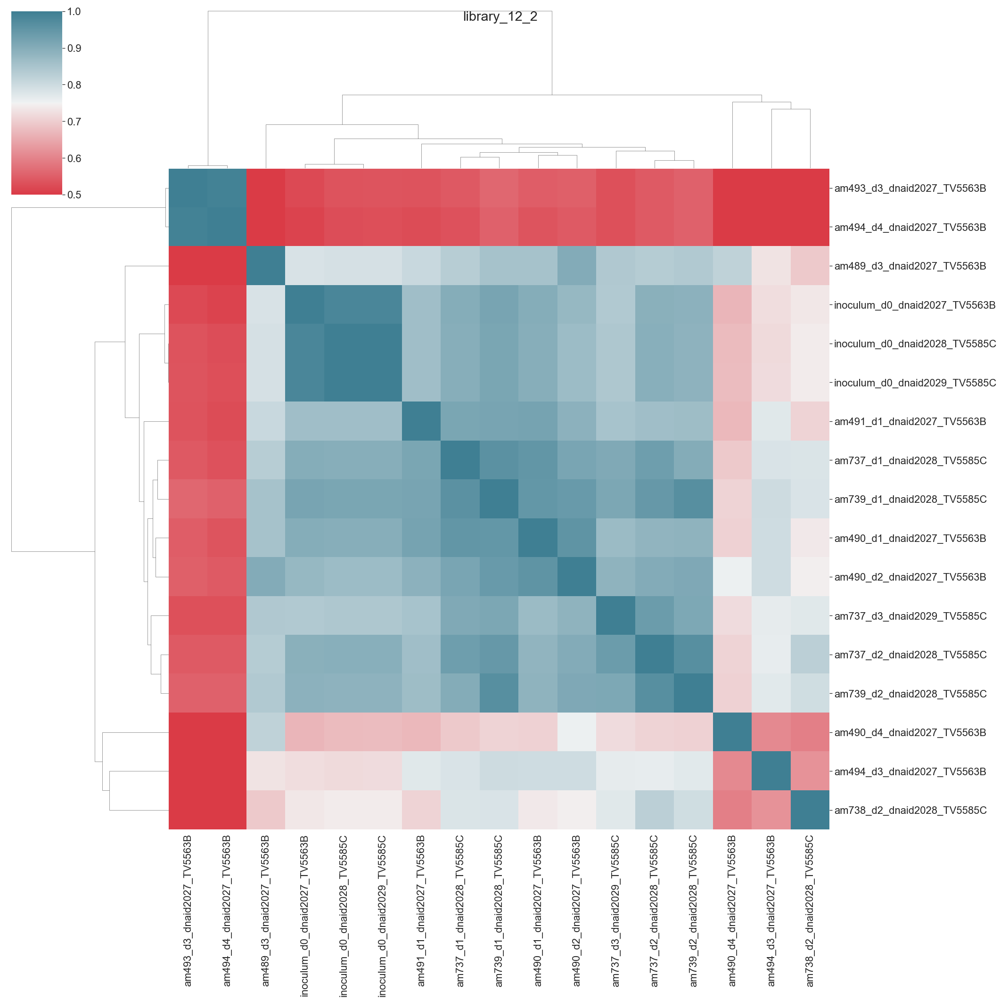

In [12]:
library = 'library_12_2'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_13_1 <a id='cor-13-1'></a>

[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



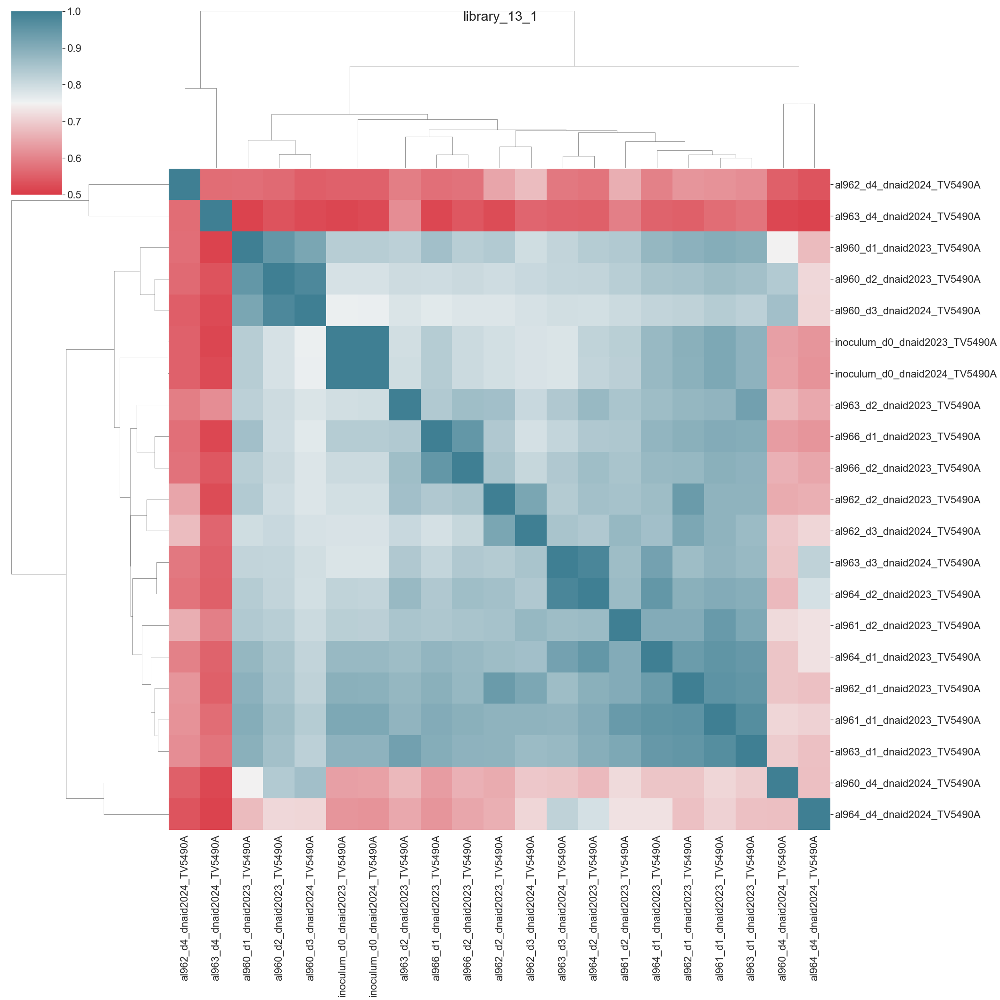

In [13]:
library = 'library_13_1'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_13_2 <a id='cor-13-2'></a>
[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



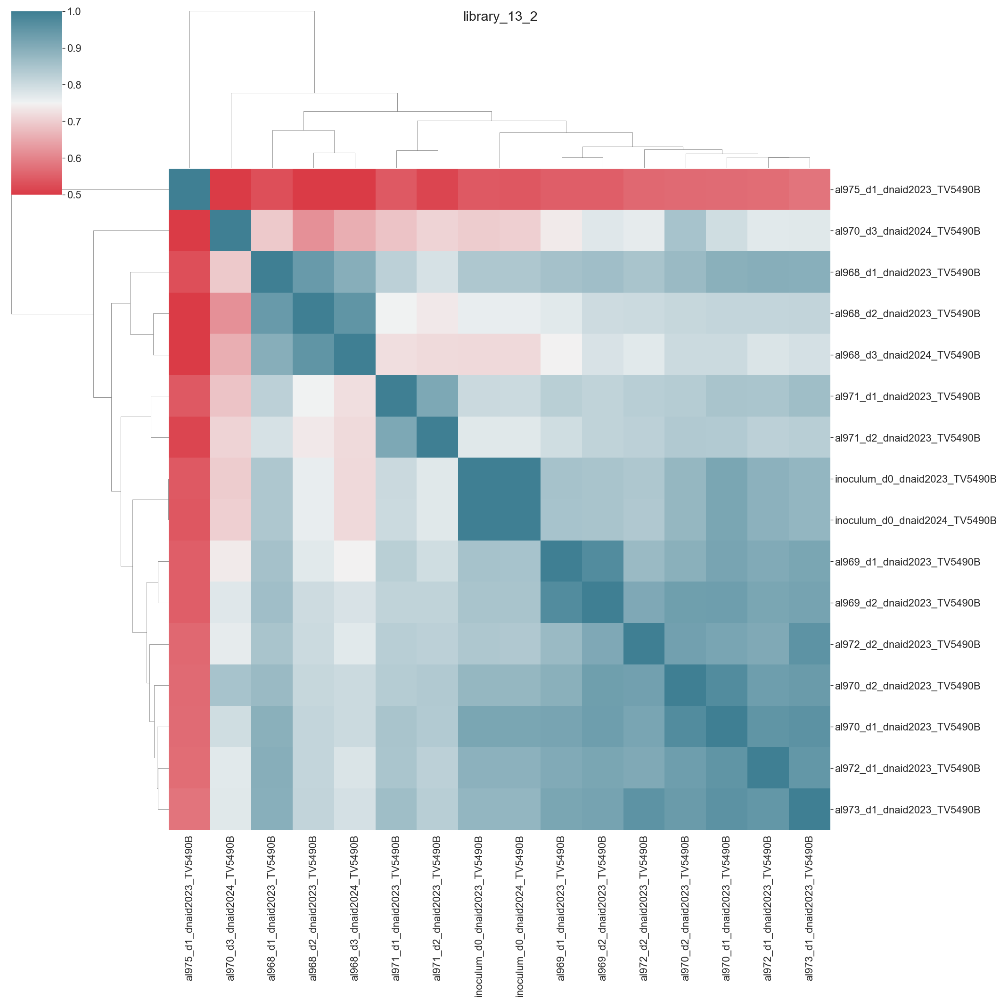

In [14]:
library = 'library_13_2'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_14_2 <a id='cor-14-2'></a>

[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



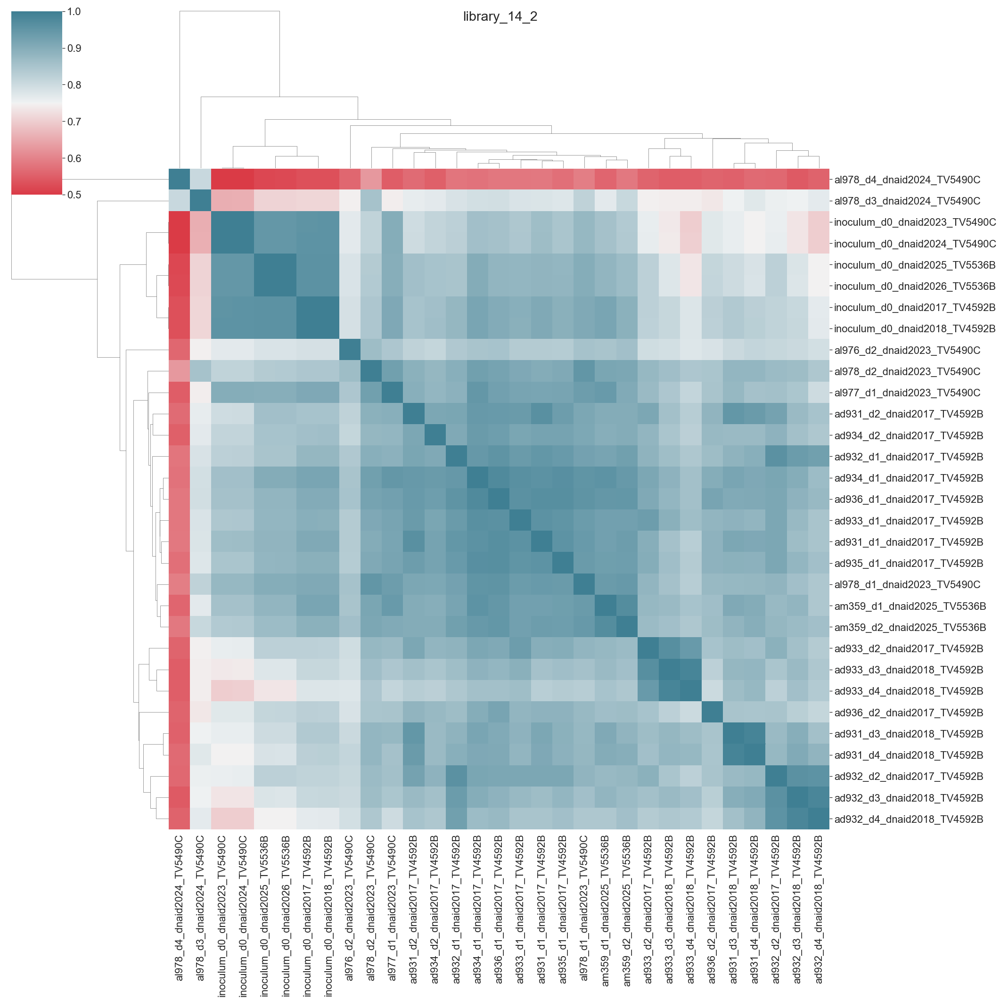

In [15]:
library = 'library_14_2'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_15_1 <a id='cor-15-1'></a>

[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



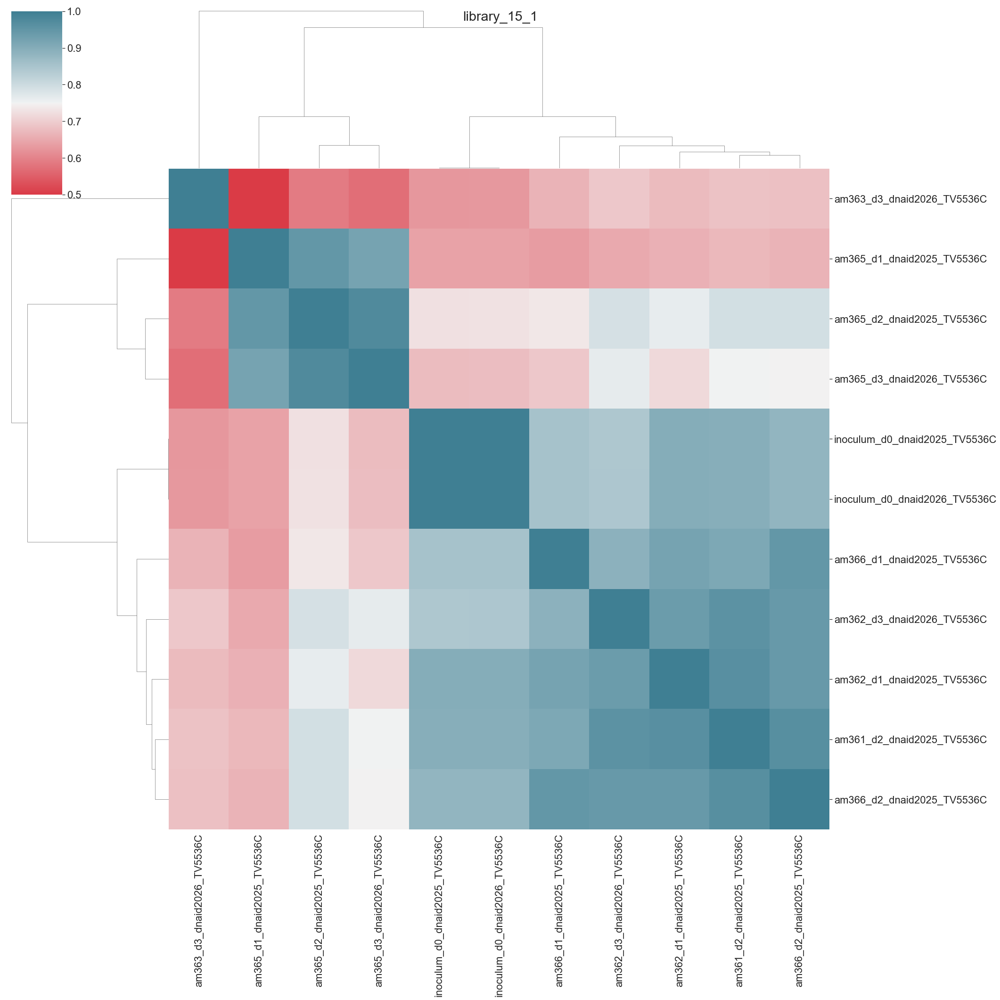

In [16]:
library = 'library_15_1'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_9_1 <a id='cor-9-1'></a>
[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



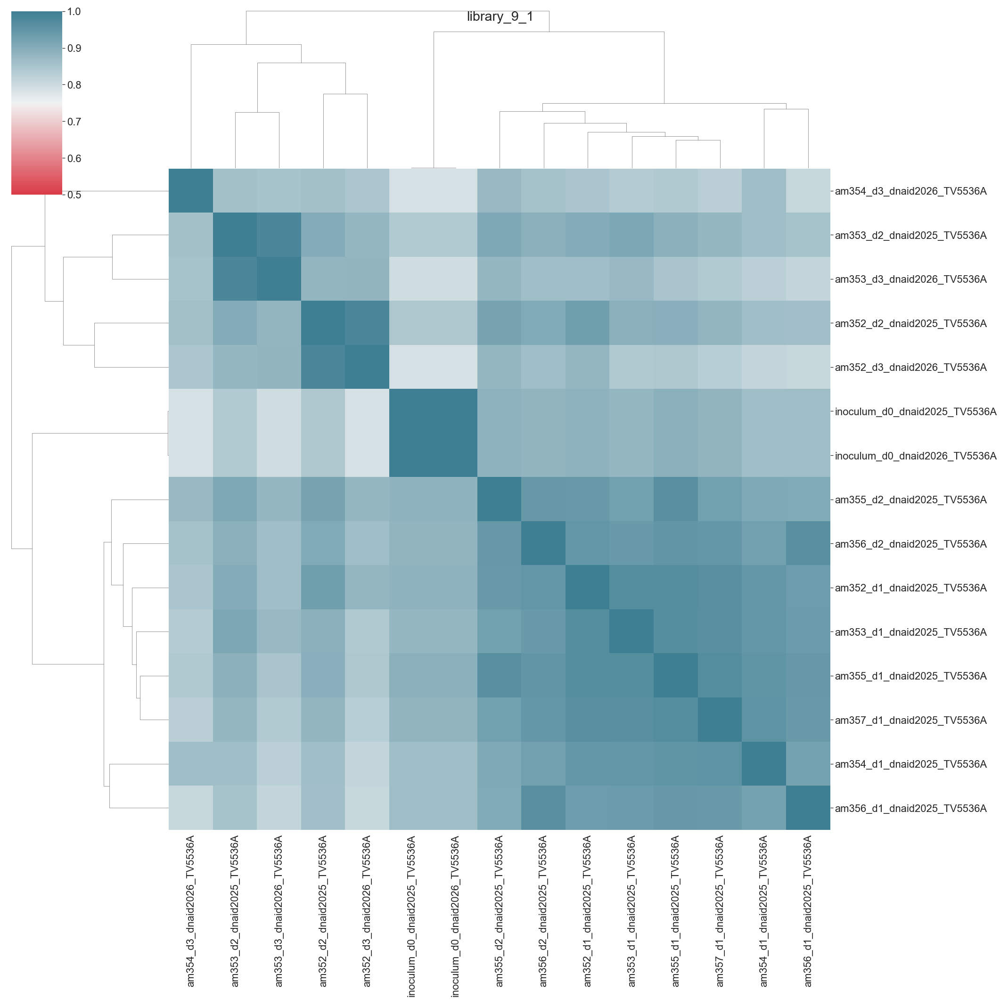

In [17]:
library = 'library_9_1'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)

p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## Correlation library_10_1 <a id='cor-10-1'></a>
[Back to the start](#start)

/Users/ansintsova/opt/miniconda3/envs/mi/lib/python3.6/site-packages/seaborn/matrix.py:1216: UserWarning:

``square=True`` ignored in clustermap



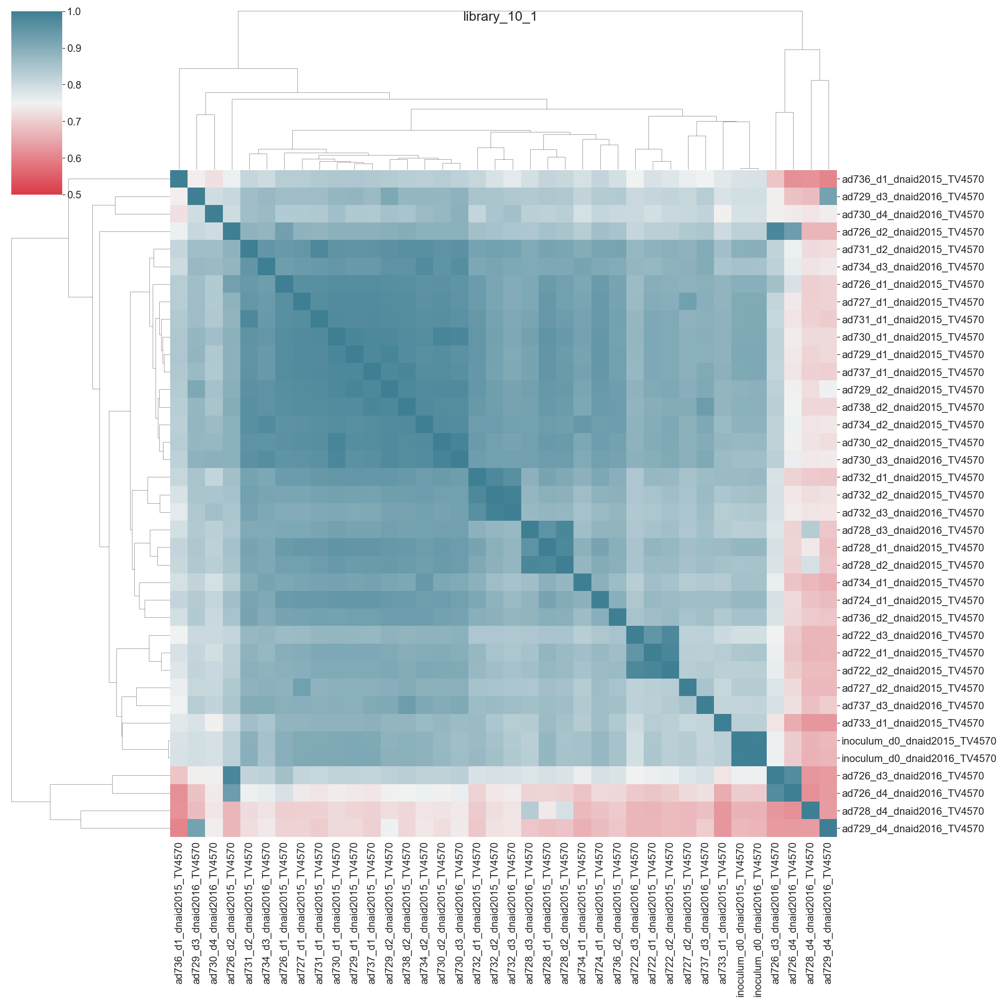

In [18]:
library = 'library_10_1'
sns.set(font_scale=2)
df = vsts[library].set_index("Unnamed: 0")
p = sns.clustermap(
    df.corr(),
    vmin=0.5,vmax=1,
    cmap=sns.diverging_palette(10, 220, n=256),
    square=True,
    figsize=(30,30)
)
p.fig.suptitle(library) 
p.savefig(figuresDir/f'{library}_correlation.pdf')

## PCA <a id='pca'></a>

[Back to the start](#start)


In [19]:
from sklearn.decomposition import PCA


def get_pca_df(library_vst, num_genes=500):
    library_vst = library_vst.set_index('Unnamed: 0')
    var_bcs = library_vst.var(axis=1).sort_values(ascending=False).head(num_genes).index
    df = library_vst.loc[var_bcs]
    meta = pd.Series(vsts[library].set_index('Unnamed: 0').columns)
    new = meta.str.split("_", expand=True)
    new.columns = ['mouse', 'day', 'dnaid', 'experiment']
    meta = pd.concat([meta, new], axis=1).set_index(0)
    pDf, pc1_var, pc2_var = find_pc1_pc2(df, meta)
    return pDf, pc1_var, pc2_var


def find_pc1_pc2(df, meta):
    df = df.T
    pca = PCA(n_components=2)
    principalComponents = pca.fit_transform(df)
    pDf = (pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'])
           .set_index(df.index))

    pc1_var = round(pca.explained_variance_ratio_[0] * 100, 2)
    pc2_var = round(pca.explained_variance_ratio_[1] * 100, 2)
    pDf2 = pDf.merge(meta, left_index=True, right_index=True)
    return pDf2, pc1_var, pc2_var



def plotPCA(pDf, pc1, pc2, title=""):
    fig = px.scatter(pDf.sort_values('day'), x='PC1', y='PC2', color='day', symbol='experiment', hover_data=['mouse'],
              template='simple_white', title=title,
              color_discrete_sequence=px.colors.qualitative.G10,
                labels ={'PC1': f'PC1, {pc1}%',
                        'PC2': f'PC2, {pc2}%',
                        'day': 'Day',
                        'experiment': 'Experiment'})


    fig.update_traces(marker=dict(size=12,
                                  line=dict(width=2,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    fig.update_layout(
        font_family="Arial",
        font_size=14,
        title_font_size=24,
        title_x=0.5
    )
    return fig

## PCA library_10_2  <a id='pca-10-2'></a>
[Back to the start](#start)

In [20]:
library = 'library_10_2'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_10_1  <a id='pca-10-1'></a>
[Back to the start](#start)

In [21]:
library = 'library_10_1'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_11_1  <a id='pca-11-1'></a>
[Back to the start](#start)

In [22]:
library = 'library_11_1'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_11_2  <a id='pca-11-2'></a>
[Back to the start](#start)

In [23]:
library = 'library_11_2'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_12_1  <a id='pca-12-1'></a>
[Back to the start](#start)

In [24]:
library = 'library_12_1'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_12_2  <a id='pca-12-2'></a>
[Back to the start](#start)

In [25]:
library = 'library_12_2'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_13_1  <a id='pca-13-1'></a>
[Back to the start](#start)

In [26]:
library = 'library_13_1'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_13_2  <a id='pca-13-2'></a>
[Back to the start](#start)

In [27]:
library = 'library_13_2'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_14_2  <a id='pca-14-2'></a>
[Back to the start](#start)

In [28]:
library = 'library_14_2'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_15_1  <a id='pca-15-1'></a>
[Back to the start](#start)

In [29]:
library = 'library_15_1'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

## PCA library_9_1  <a id='pca-9-1'></a>
[Back to the start](#start)

In [30]:
library = 'library_9_1'
pDf, pc1_var, pc2_var = get_pca_df(vsts[library], num_genes=50)
f = plotPCA(pDf, pc1_var, pc2_var, title=library)
f.write_image(str(figuresDir/f"{library}_pca.pdf"))
f

# Method 2: Problems  <a id='Method-2'></a>

[Back to the start](#start)

In [31]:
ssa=pd.read_csv(resultsDir/"20-07-m2_ssa_ci_no_skew")
new = ssa['Unnamed: 0'].str.split("_", expand=True)
new.columns = ['mouse', 'day', 'dnaid', 'experiment']
ssa = pd.concat([ssa, new], axis=1)

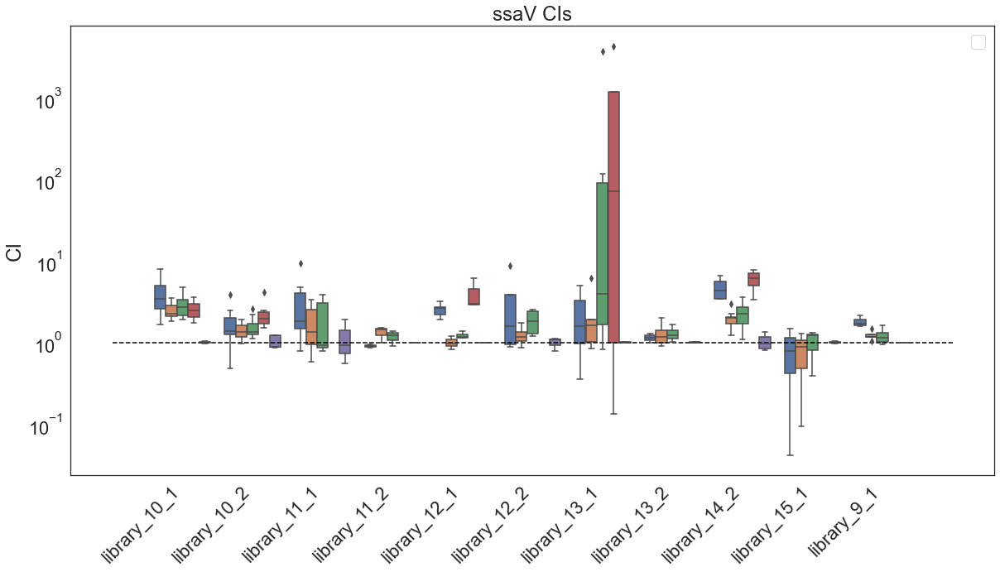

In [32]:
sns.set(font_scale=2)
sns.set_style('white')
fig = plt.figure(figsize=(20,10))
p = sns.boxplot(data=ssa.sort_values('library'), x='library', y='ssa_ci', hue='day')
#sns.stripplot(data=ssa, x='library', y='ssa_ci', hue='day', color='black')
plt.hlines(y=1, xmin=-1, xmax=11, color='black', linestyles='dashed')
plt.yscale('log')
plt.xticks(rotation=45, ha='right')
plt.legend('')
plt.xlabel('')
plt.ylabel("CI")
plt.title("ssaV CIs")
fig.savefig(figuresDir/'ssa_CI.pdf')

In [4]:
approx_pos = pd.read_csv(resultsDir/"approx_pos.csv", index_col=0).rename({'gene':'ShortName'}, axis=1)

In [34]:
res_m1 = pd.read_csv(resultsDir/"20-07-method1_skewed_removed.csv", index_col=0)
res_m1.columns = ["m1_"+c if c not in ['library', 'ShortName', 'day'] else c for c in res_m1.columns ]
res_m2 = pd.read_csv(resultsDir/"20-07-m2_results_ci_no_skew", index_col=0)
res_m2.columns = ["m2_"+c if c not in ['library', 'ShortName', 'day'] else c for c in res_m2.columns ]

#
res_m1s = pd.read_csv(resultsDir/"20-07-method1_with_skewed.csv", index_col=0)
res_m1s.columns = ["m1_"+c if c not in ['library', 'ShortName', 'day'] else c for c in res_m1s.columns ]
res_m2s = pd.read_csv(resultsDir/"20-07-m2_results_ci_skew", index_col=0)
res_m2s.columns = ["m2_"+c if c not in ['library', 'ShortName', 'day'] else c for c in res_m2s.columns ]
res_m2 = res_m2.merge(approx_pos, on=['ShortName', 'library'])

## Method 2 Summary: <a id='m2-sum'></a>

[Back to the start](#start)

In [35]:
# Look only at mapped positions:
m2_mapped = res_m2[res_m2.ShortName.str.len() < 10].sort_values('library')
res_sum = m2_mapped[m2_mapped.m2_padj < 0.05].groupby(['library', 'day']).ShortName.nunique().reset_index()
res_sum.columns = ['library', 'day', 'number of hits']
res_sum

,library,day,number of hits
0,library_10_1,d1,376
1,library_10_1,d2,419
2,library_10_1,d3,396
3,library_10_1,d4,345
4,library_10_2,d1,253
5,library_10_2,d2,407
6,library_10_2,d4,61
7,library_12_1,d1,63
8,library_12_1,d2,498
9,library_12_1,d3,470


In [9]:
def graph_hits_along_chr(df, day,  y_axis, pval_col, p_cutoff=0.05, fc_cutoff=0, chrm= 'FQ312003.1'):
    g = df[(df.day == day)&(df.sseqid == chrm)]
    g['hit'] = ((g[pval_col] < p_cutoff) & (abs(np.log2(g[y_axis])) > fc_cutoff))
    g['sstart'] == g['sstart']/1000000
    f = px.scatter(g, x='sstart', y=y_axis, log_y=True, template='simple_white', color='hit',
                   color_discrete_sequence=['#737373', '#ff0000'],hover_data=['ShortName', 'library', 'sstart'],
                    opacity=0.5, width=1200, height=600,  labels = {y_axis: 'CI', 
                             'sstart': 'Position'},
                  title=f'Day: {day}. Number of hits: {g["hit"].sum()}, Number of unique hits: {g[g.hit==True].ShortName.nunique()}')
    f.update_traces(marker=dict(size=7,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey')),
                   
                  selector=dict(mode='markers'))
    return f



## Method 2: Day 1. No LFC cutoff  <a id='m2-day1-lfc0'></a>


- Looking at hits that mapped to an ORF

[Back to the start](#start)

In [10]:
f = graph_hits_along_chr(m2_mapped, day='d1',  fc_cutoff=0, y_axis='m2_ci', pval_col='m2_padj')
f.write_image(str(figuresDir/f"method2_results_d1_0.05_0.pdf"))
f

NameError: name 'm2_mapped' is not defined

## Method 2: Day 1.   <a id='m2-day1-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [38]:
f = graph_hits_along_chr(m2_mapped, day='d1',  fc_cutoff=1, y_axis='m2_ci', pval_col='m2_padj')
f.write_image(str(figuresDir/f"method2_results_d1_0.05_1.pdf"))
f

## Method 2: Day 2.  <a id='m2-day1-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [39]:
f = graph_hits_along_chr(m2_mapped, day='d2',  fc_cutoff=1, y_axis='m2_ci', pval_col='m2_padj')
f.write_image(str(figuresDir/f"method2_results_d2_0.05_1.pdf"))
f

## Method 2: Day 3.  <a id='m2-day3-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [40]:
f = graph_hits_along_chr(m2_mapped, day='d3',  fc_cutoff=1, y_axis='m2_ci', pval_col='m2_padj')
f.write_image(str(figuresDir/f"method2_results_d3_0.05_1.pdf"))
f

## Method 2: Day 4.  <a id='m2-day4-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [41]:
f = graph_hits_along_chr(m2_mapped, day='d4',  fc_cutoff=1, y_axis='m2_ci', pval_col='m2_padj')
f.write_image(str(figuresDir/f"method2_results_d4_0.05_1.pdf"))
f

# Final Results:  <a id='Final'></a>




[Back to the start](#start)

## Summary: <a id='m1-sum'></a>

In [5]:

fres = pd.read_csv(resultsDir/'27-07-results.csv', index_col=0).rename({'gene':'ShortName'}, axis=1)
fres = fres.merge(approx_pos, on=['ShortName', 'library'])
fres_mapped = fres[fres.ShortName.str.len() <10]
fres_sum = fres_mapped[fres_mapped.zscore_padj < 0.05].groupby(['library', 'day']).ShortName.nunique().reset_index()
fres_sum.columns = ['library', 'day', 'number of hits']
fres_sum

,library,day,number of hits
0,library_10_1,d1,55
1,library_10_1,d2,53
2,library_10_1,d3,63
3,library_10_1,d4,106
4,library_10_2,d1,12
5,library_10_2,d2,25
6,library_10_2,d3,58
7,library_10_2,d4,34
8,library_11_1,d1,152
9,library_11_1,d2,294


## Method 1: Day 1.   <a id='m1-day1-lfc0'></a>


- Looking at hits that mapped to an ORF
- No LFC cutoff

[Back to the start](#start)

In [8]:
f = graph_hits_along_chr(fres_mapped, day='d1',  fc_cutoff=0, y_axis='CI', pval_col='zscore_padj')

#f.write_image(str(figuresDir/f"final_results_d1_0.05_0.pdf"))
#f

NameError: name 'graph_hits_along_chr' is not defined

## Method 1: Day 1.   <a id='m1-day1-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [13]:
f = graph_hits_along_chr(fres_mapped, day='d1',  fc_cutoff=1, y_axis='CI', pval_col='zscore_padj')
#f.write_image(str(figuresDir/f"final_results_d1_0.05_1.pdf"))
#f.write_html(str(figuresDir/f"final_results_d1_0.05_1.html"))
f

## Method 1: Day 2.   <a id='m1-day2-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [14]:
f = graph_hits_along_chr(fres_mapped, day='d2',  fc_cutoff=1, y_axis='CI', pval_col='zscore_padj')
#f.write_image(str(figuresDir/f"final_results_d2_0.05_1.pdf"))
#f.write_html(str(figuresDir/f"final_results_d2_0.05_1.html"))
f

## Method 1: Day 3.   <a id='m1-day3-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [16]:
f = graph_hits_along_chr(fres_mapped, day='d3',  fc_cutoff=1, y_axis='CI', pval_col='zscore_padj')
#f.write_image(str(figuresDir/f"final_results_d3_0.05_1.pdf"))
#f.write_html(str(figuresDir/f"final_results_d3_0.05_1.html"))
f

## Method 1: Day 4.   <a id='m1-day4-lfc1'></a>


- Looking at hits that mapped to an ORF
- LFC > 1

[Back to the start](#start)

In [17]:
f = graph_hits_along_chr(fres_mapped, day='d4',  fc_cutoff=1, y_axis='CI', pval_col='zscore_padj')
#f.write_image(str(figuresDir/f"final_results_d4_0.05_1.pdf"))
#f.write_html(str(figuresDir/f"final_results_d4_0.05_1.html"))
f

In [49]:
resultsNoSkew = res_m1.merge(res_m2, on=['library', 'day', 'ShortName'])
resultsNoSkew['m1_hits'] = (resultsNoSkew.m1_padj < 0.05).astype(int)
resultsNoSkew['m2_hits'] = (resultsNoSkew.m2_padj < 0.05).astype(int)*2
resultsNoSkew['hits_int'] = resultsNoSkew['m1_hits'] + resultsNoSkew['m2_hits']
hit_labels = {0: 'Not a hit', 1: 'Method 1 Hit', 2: 'Method 2 Hit', 3: 'Method 1 and 2 Hit'}
resultsNoSkew['hits'] = resultsNoSkew['hits_int'].map(hit_labels)

In [50]:
res_m1s.head()

,m1_gene,day,m1_gene_FC,m1_gene_FC_median,m1_sigma,m1_zscore,m1_ci,m1_pval,m1_padj,m1_n_samples,library,ShortName,m1_num_barcodes,m1_barcode,m1_control
0,SL1344_0014,d1,0.138678,0.138678,0.091293,3.422489,1.539817,0.000621,0.006126,6.0,library_11_1,SL1344_0014,2.0,"CCTGTCGCGATAGCTTG, CGTGACAAGCCACTCGG",NaN
1,SL1344_0014,d2,0.089514,0.089514,0.091316,3.752748,1.605578,0.000175,0.001048,6.0,library_11_1,SL1344_0014,2.0,"CCTGTCGCGATAGCTTG, CGTGACAAGCCACTCGG",NaN
2,SL1344_0014,d3,-0.034684,-0.034684,0.091682,-0.434422,0.946570,0.663982,0.878620,6.0,library_11_1,SL1344_0014,2.0,"CCTGTCGCGATAGCTTG, CGTGACAAGCCACTCGG",NaN
3,SL1344_0015,d1,0.263348,0.263348,0.116180,3.820524,1.678799,0.000133,0.002353,6.0,library_11_1,SL1344_0015,1.0,ATGAAAAGTATGAATCC,NaN
4,SL1344_0015,d2,0.219084,0.219084,0.116202,4.152668,1.756451,0.000033,0.000304,6.0,library_11_1,SL1344_0015,1.0,ATGAAAAGTATGAATCC,NaN


In [51]:
resultsSkew = res_m1s.merge(res_m2s, on=['library', 'day', 'ShortName'])
resultsSkew['m1_hits'] = (resultsSkew.m1_padj < 0.05).astype(int)
resultsSkew['m2_hits'] = (resultsSkew.m2_padj < 0.05).astype(int)*2
resultsSkew['hits_int'] = resultsSkew['m1_hits'] + resultsSkew['m2_hits']
hit_labels = {0: 'Not a hit', 1: 'Method 1 Hit', 2: 'Method 2 Hit', 3: 'Method 1 and 2 Hit'}
resultsSkew['hits'] = resultsSkew['hits_int'].map(hit_labels)

In [52]:
#resultsNoSkew.groupby(['library', 'day']).agg({'m1_hits':['sum'], 'm2_hits':[lambda x: sum(x)/2]})